# PRJN392905 - ATAC-Seq SPAN, MACS vs DNAse hypersensitive sites

Before launch corresponding .
```
git checkout https://github.com/JetBrains-Research/sc-atacseq-smk-pipeline
cd /mnt/stripe/shpynov/sc-atacseq-smk-pipeline

for Q in 0.5 0.1 0.05 0.01 0.001 1E-4 1E-6 1E-9 1E-12; do 
    echo $Q; 
    snakemake -s /mnt/stripe/shpynov/chipseq-smk-pipeline/Snakefile all --cores 24 --use-conda --config work_dir=/mnt/stripe/shpynov/PRJN392905 genome=mm10 fastq_dir=/mnt/stripe/shpynov/PRJN392905/fastq macs2_suffix=q${Q} macs2_params=-q ${Q} -f BAMPE --nomodel --nolambda -B --call-summits span_fdr=${Q} span_params=--fragment 0; 
done
```


In [1]:
%config InlineBackend.figure_format = 'retina'
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
from pybedtools import BedTool
import subprocess
import math
import glob
import re

In [8]:
CELLS = [re.sub('.*/|_q.*', '', f) for f in glob.glob('/mnt/stripe/shpynov/PRJN392905/macs2/*q0.05*.narrowPeak')]
print(len(CELLS))

180


In [9]:
EXPERIMENT_FOLDER = "/mnt/stripe/shpynov/PRJN392905"
QS = ["0.5", "0.1", "0.05", "0.01", "0.001", "1E-4", "1E-6", "1E-9", "1E-12"]
# SPAN uses different FDR naming
SPAN_QS = ["0.5", "0.1", "0.05", "0.01", "0.001", "0.0001", "1e-06", "1e-09", "1e-12"]

# DHS was obtained from https://www.encodeproject.org
# hg19 representative DHS sites: https://www.encodeproject.org/annotations/ENCSR664FOJ/
dhs_mm10 = BedTool(os.path.join(EXPERIMENT_FOLDER, "dhs", "mm10_dhs.bed"))

CHROM_SIZES = os.path.join(EXPERIMENT_FOLDER, "mm10.chrom.sizes")

# Populate MACS2 entries

In [ ]:
# discover MACS2 peak files
macs2_peaks_paths = {}
for cell in CELLS:
    macs2_peaks_paths[cell] = {
        q: os.path.join(EXPERIMENT_FOLDER, "macs2",
                        "{}_q{}_peaks.narrowPeak".format(cell, q)) for q in QS}


df_macs2_path = os.path.join(EXPERIMENT_FOLDER, 'df_macs2.csv')
if not os.path.exists(df_macs2_path):
    df_macs2 = pd.DataFrame(columns=['peak_caller', 'cell', 'q', 'bin', 'gap',
                                     'peak_count', 'dhs_by_peak', 'peak_by_dhs'])
else:
    print('Loading', df_macs2_path)
    df_macs2 = pd.read_csv(df_macs2_path)

    
for i, cell in enumerate(CELLS):
    print('Processing cell', i + 1, 'of', len(CELLS))
    for q in QS:
        # Already have it processed
        if len(df_macs2[np.logical_and(df_macs2['cell'] == cell, df_macs2['q'] == float(q))]) == 0:
            print("Processing {} for q={}".format(cell, q))
            peaks_file = BedTool(macs2_peaks_paths[cell][q])
            peak_count = peaks_file.count()
            overlap = peaks_file.intersect(dhs_mm10, wa=True, u=True).count()
            peak_by_dhs = 0 if overlap == 0 else overlap * 100.0 / peak_count
            overlap = dhs_mm10.intersect(peaks_file, wa=True, u=True).count()
            dhs_by_peak = overlap * 100.0 / dhs_mm10.count()
            df_macs2.loc[len(df_macs2)] = ('macs2', cell, float(q), math.nan, math.nan,
                                           peak_count, dhs_by_peak, peak_by_dhs)
print('Saved', df_macs2_path)
df_macs2.to_csv(df_macs2_path, index=None)

df_macs2.head()

Loading /mnt/stripe/shpynov/PRJN392905/df_macs2.csv
Processing cell 1 of 180
Processing GSM2692250_Spleen_B_Cell_ATAC_seq for q=0.05
Processing GSM2692250_Spleen_B_Cell_ATAC_seq for q=0.001
Processing cell 2 of 180
Processing GSM2692224_Spleen_CD8_T_Cell_ATAC_seq for q=0.05
Processing GSM2692224_Spleen_CD8_T_Cell_ATAC_seq for q=0.001
Processing cell 3 of 180
Processing GSM2692296_Skin_draining_lymph_node_Stromal_Cell_ATAC_seq for q=0.05
Processing GSM2692296_Skin_draining_lymph_node_Stromal_Cell_ATAC_seq for q=0.001
Processing cell 4 of 180
Processing GSM2692248_Spleen_B_Cell_ATAC_seq for q=0.05
Processing GSM2692248_Spleen_B_Cell_ATAC_seq for q=0.001
Processing cell 5 of 180
Processing GSM2692186_Spleen_CD4_Naive_T_Cell_ATAC_seq for q=0.05
Processing GSM2692186_Spleen_CD4_Naive_T_Cell_ATAC_seq for q=0.001
Processing cell 6 of 180
Processing GSM2692242_Bone_marrow_B_Cell_ATAC_seq for q=0.05
Processing GSM2692242_Bone_marrow_B_Cell_ATAC_seq for q=0.001
Processing cell 7 of 180
Processin

Processing cell 53 of 180
Processing GSM2692240_Bone_marrow_B_Cell_ATAC_seq for q=0.05
Processing GSM2692240_Bone_marrow_B_Cell_ATAC_seq for q=0.001
Processing cell 54 of 180
Processing GSM2692272_Small_intestine_Innate_Lymphocytes_ATAC_seq for q=0.05
Processing GSM2692272_Small_intestine_Innate_Lymphocytes_ATAC_seq for q=0.001
Processing cell 55 of 180
Processing GSM2692275_Small_intestine_Innate_Lymphocytes_ATAC_seq for q=0.05
Processing GSM2692275_Small_intestine_Innate_Lymphocytes_ATAC_seq for q=0.001
Processing cell 56 of 180
Processing GSM2692269_Spleen_NKT_Cell_ATAC_seq for q=0.05
Processing GSM2692269_Spleen_NKT_Cell_ATAC_seq for q=0.001
Processing cell 57 of 180
Processing GSM2692302_Spleen_B_Cell_ATAC_seq for q=0.05
Processing GSM2692302_Spleen_B_Cell_ATAC_seq for q=0.001
Processing cell 58 of 180
Processing GSM2692194_Bone_marrow_Neutrophil_ATAC_seq for q=0.05
Processing GSM2692194_Bone_marrow_Neutrophil_ATAC_seq for q=0.001
Processing cell 59 of 180
Processing GSM2692244_Sp

Processing GSM2692267_Spleen_NKT_Cell_ATAC_seq for q=0.001
Processing cell 107 of 180
Processing GSM2692324_Peritoneal_cavity_Macrophage_ATAC_seq for q=0.05
Processing GSM2692324_Peritoneal_cavity_Macrophage_ATAC_seq for q=0.001
Processing cell 108 of 180
Processing GSM2692315_Small_intestine_Dendritic_Cell_ATAC_seq for q=0.05
Processing GSM2692315_Small_intestine_Dendritic_Cell_ATAC_seq for q=0.001
Processing cell 109 of 180
Processing GSM2692329_Blood_Monocyte_ATAC_seq for q=0.05
Processing GSM2692329_Blood_Monocyte_ATAC_seq for q=0.001
Processing cell 110 of 180
Processing GSM2692346_Spleen_CD4_Treg_Cell_ATAC_seq for q=0.05
Processing GSM2692346_Spleen_CD4_Treg_Cell_ATAC_seq for q=0.001
Processing cell 111 of 180
Processing GSM2692310_Small_intestine_lamina_propria_Macrophage_ATAC_seq for q=0.05
Processing GSM2692310_Small_intestine_lamina_propria_Macrophage_ATAC_seq for q=0.001
Processing cell 112 of 180
Processing GSM2692339_Spleen_Dendritic_Cell_ATAC_seq for q=0.05
Processing GSM

Processing GSM2692243_Bone_marrow_B_Cell_ATAC_seq for q=0.001
Processing cell 159 of 180
Processing GSM2692241_Bone_marrow_B_Cell_ATAC_seq for q=0.05
Processing GSM2692241_Bone_marrow_B_Cell_ATAC_seq for q=0.001
Processing cell 160 of 180
Processing GSM2692174_Thymus_Double_Negative_Thymocytes_ATAC_seq for q=0.05
Processing GSM2692174_Thymus_Double_Negative_Thymocytes_ATAC_seq for q=0.001
Processing cell 161 of 180
Processing GSM2692288_Spleen_Macrophage_ATAC_seq for q=0.05
Processing GSM2692288_Spleen_Macrophage_ATAC_seq for q=0.001
Processing cell 162 of 180
Processing GSM2692176_Thymus_Double_Negative_Thymocytes_ATAC_seq for q=0.05
Processing GSM2692176_Thymus_Double_Negative_Thymocytes_ATAC_seq for q=0.001
Processing cell 163 of 180
Processing GSM2692203_Spleen_NK_Cell_ATAC_seq for q=0.05
Processing GSM2692203_Spleen_NK_Cell_ATAC_seq for q=0.001
Processing cell 164 of 180
Processing GSM2692171_Thymus_Double_Negative_Thymocytes_ATAC_seq for q=0.05
Processing GSM2692171_Thymus_Double

,peak_caller,cell,q,bin,gap,peak_count,dhs_by_peak,peak_by_dhs
0,macs2,GSM2692224_Spleen_CD8_T_Cell_ATAC_seq,0.500000,NaN,NaN,93436,5.276455,67.217133
1,macs2,GSM2692224_Spleen_CD8_T_Cell_ATAC_seq,0.100000,NaN,NaN,42426,3.023472,90.387970
2,macs2,GSM2692224_Spleen_CD8_T_Cell_ATAC_seq,0.010000,NaN,NaN,30820,2.266204,95.515899
3,macs2,GSM2692224_Spleen_CD8_T_Cell_ATAC_seq,0.000100,NaN,NaN,21309,1.568191,96.668075
4,macs2,GSM2692224_Spleen_CD8_T_Cell_ATAC_seq,0.000001,NaN,NaN,18393,1.359838,96.862937


# Populate Span entries

In [ ]:
# discover Span peak files
span_peaks_paths = {}
for cell in CELLS:
    span_peaks_paths[cell] = {
        q: os.path.join(EXPERIMENT_FOLDER, "span",
                        "{}_100_{}_5.peak".format(cell, SPAN_QS[i])) for i, q in enumerate(QS)}


df_span_path = os.path.join(EXPERIMENT_FOLDER, 'df_span.csv')
if not os.path.exists(df_span_path):
    df_span = pd.DataFrame(columns=['peak_caller', 'cell', 'q', 'bin', 'gap',
                                     'peak_count', 'dhs_by_peak', 'peak_by_dhs'])
else:
    print('Loading', df_span_path)
    df_span = pd.read_csv(df_span_path)

for i, cell in enumerate(CELLS):
    print('Processing', i, 'of', len(CELLS))
    for q in QS:
        # Already have it processed
        if len(df_span[np.logical_and(df_span['cell'] == cell, df_span['q'] == float(q))]) == 0:
            print("Processing {} for q={}".format(cell, q))
            peaks_file = BedTool(span_peaks_paths[cell][q])
            peak_count = peaks_file.count()
            overlap = peaks_file.intersect(dhs_mm10, wa=True, u=True).count()
            peak_by_dhs = 0 if overlap == 0 else overlap * 100.0 / peak_count
            overlap = dhs_mm10.intersect(peaks_file, wa=True, u=True).count()
            dhs_by_peak = overlap * 100.0 / dhs_mm10.count()
            df_span.loc[len(df_span)] = ('span', cell, float(q), 100, 5,
                                           peak_count, dhs_by_peak, peak_by_dhs)

print('Saved', df_span_path)
df_span.to_csv(df_span_path, index=None)
df_span.head()

Loading /mnt/stripe/shpynov/PRJN392905/df_span.csv
Processing 0 of 180
Processing GSM2692250_Spleen_B_Cell_ATAC_seq for q=0.05
Processing GSM2692250_Spleen_B_Cell_ATAC_seq for q=0.001
Processing 1 of 180
Processing GSM2692224_Spleen_CD8_T_Cell_ATAC_seq for q=0.05
Processing GSM2692224_Spleen_CD8_T_Cell_ATAC_seq for q=0.001
Processing 2 of 180
Processing GSM2692296_Skin_draining_lymph_node_Stromal_Cell_ATAC_seq for q=0.05
Processing GSM2692296_Skin_draining_lymph_node_Stromal_Cell_ATAC_seq for q=0.001
Processing 3 of 180
Processing GSM2692248_Spleen_B_Cell_ATAC_seq for q=0.05
Processing GSM2692248_Spleen_B_Cell_ATAC_seq for q=0.001
Processing 4 of 180
Processing GSM2692186_Spleen_CD4_Naive_T_Cell_ATAC_seq for q=0.05
Processing GSM2692186_Spleen_CD4_Naive_T_Cell_ATAC_seq for q=0.001
Processing 5 of 180
Processing GSM2692242_Bone_marrow_B_Cell_ATAC_seq for q=0.05
Processing GSM2692242_Bone_marrow_B_Cell_ATAC_seq for q=0.001
Processing 6 of 180
Processing GSM2692197_Peritoneal_cavity_Neutr

Processing GSM2692272_Small_intestine_Innate_Lymphocytes_ATAC_seq for q=0.001
Processing 54 of 180
Processing GSM2692275_Small_intestine_Innate_Lymphocytes_ATAC_seq for q=0.05
Processing GSM2692275_Small_intestine_Innate_Lymphocytes_ATAC_seq for q=0.001
Processing 55 of 180
Processing GSM2692269_Spleen_NKT_Cell_ATAC_seq for q=0.05
Processing GSM2692269_Spleen_NKT_Cell_ATAC_seq for q=0.001
Processing 56 of 180
Processing GSM2692302_Spleen_B_Cell_ATAC_seq for q=0.05
Processing GSM2692302_Spleen_B_Cell_ATAC_seq for q=0.001
Processing 57 of 180
Processing GSM2692194_Bone_marrow_Neutrophil_ATAC_seq for q=0.05
Processing GSM2692194_Bone_marrow_Neutrophil_ATAC_seq for q=0.001
Processing 58 of 180
Processing GSM2692244_Spleen_B_Cell_ATAC_seq for q=0.05
Processing GSM2692244_Spleen_B_Cell_ATAC_seq for q=0.001
Processing 59 of 180
Processing GSM2692221_Lymph_nodes_gdT_Cell_ATAC_seq for q=0.05
Processing GSM2692221_Lymph_nodes_gdT_Cell_ATAC_seq for q=0.001
Processing 60 of 180
Processing GSM26922

Processing GSM2692329_Blood_Monocyte_ATAC_seq for q=0.001
Processing 109 of 180
Processing GSM2692346_Spleen_CD4_Treg_Cell_ATAC_seq for q=0.05
Processing GSM2692346_Spleen_CD4_Treg_Cell_ATAC_seq for q=0.001
Processing 110 of 180
Processing GSM2692310_Small_intestine_lamina_propria_Macrophage_ATAC_seq for q=0.05
Processing GSM2692310_Small_intestine_lamina_propria_Macrophage_ATAC_seq for q=0.001
Processing 111 of 180
Processing GSM2692339_Spleen_Dendritic_Cell_ATAC_seq for q=0.05
Processing GSM2692339_Spleen_Dendritic_Cell_ATAC_seq for q=0.001
Processing 112 of 180
Processing GSM2692259_Bone_marrow_B_Cell_ATAC_seq for q=0.05
Processing GSM2692259_Bone_marrow_B_Cell_ATAC_seq for q=0.001
Processing 113 of 180
Processing GSM2692313_Small_intestine_Dendritic_Cell_ATAC_seq for q=0.05
Processing GSM2692313_Small_intestine_Dendritic_Cell_ATAC_seq for q=0.001
Processing 114 of 180
Processing GSM2692219_Lymph_nodes_gdT_Cell_ATAC_seq for q=0.05
Processing GSM2692219_Lymph_nodes_gdT_Cell_ATAC_seq 

In [25]:
main_dataframe = pd.concat([df_macs2, df_span])
main_dataframe = main_dataframe.sort_values(['cell', 'peak_caller', 'q'])
main_dataframe.to_csv(os.path.join(EXPERIMENT_FOLDER, 'df.csv'), index=None)

In [76]:
overlap_dataframe = main_dataframe[np.logical_not(np.isnan(main_dataframe['dhs_by_peak']))]
overlap_dataframe.describe()

,q,bin,gap,peak_count,dhs_by_peak,peak_by_dhs
count,3.240000e+03,1620.0,1620.0,3240.000000,3240.000000,3240.000000
mean,7.345567e-02,100.0,5.0,46494.329321,4.086075,90.835401
std,1.542384e-01,0.0,0.0,58382.110328,4.179641,10.925011
min,1.000000e-12,100.0,5.0,0.000000,0.000000,0.000000
25%,1.000000e-06,100.0,5.0,20809.750000,1.799439,90.078006
50%,1.000000e-03,100.0,5.0,34457.500000,3.118480,94.925171
75%,5.000000e-02,100.0,5.0,54224.750000,5.049116,97.184087
max,5.000000e-01,100.0,5.0,807967.000000,64.577032,99.280977


# Failed tracks

In [77]:
failed_cells = list(set(overlap_dataframe[overlap_dataframe['peak_count'] > 200000]['cell']))
print('Failed', failed_cells)
overlap_dataframe=overlap_dataframe[[c not in failed_cells for c in overlap_dataframe['cell']]]

Failed ['GSM2692329_Blood_Monocyte_ATAC_seq', 'GSM2692169_Thymus_Thymic_epithelial_Cell_ATAC_seq', 'GSM2692312_Small_intestine_Dendritic_Cell_ATAC_seq', 'GSM2692182_Thymus_CD4_SP_Thymocytes_ATAC_seq', 'GSM2692235_Bone_marrow_B_Cell_ATAC_seq', 'GSM2692340_Skin_draining_lymph_node_Stromal_Cell_ATAC_seq', 'GSM2692237_Bone_marrow_B_Cell_ATAC_seq', 'GSM2692233_Small_Intestine_CD8_T_Cell_ATAC_seq', 'GSM2692296_Skin_draining_lymph_node_Stromal_Cell_ATAC_seq', 'GSM2692335_Thymus_DP_Thymocytes_ATAC_seq', 'GSM2692284_Peritoneal_cavity_Macrophage_ATAC_seq', 'GSM2692324_Peritoneal_cavity_Macrophage_ATAC_seq', 'GSM2692278_Small_intestine_Innate_Lymphocytes_ATAC_seq', 'GSM2692334_Thymus_DP_Thymocytes_ATAC_seq', 'GSM2692313_Small_intestine_Dendritic_Cell_ATAC_seq', 'GSM2692215_Thymus_gdT_Cell_ATAC_seq', 'GSM2692286_Peritoneal_cavity_Macrophage_ATAC_seq', 'GSM2692325_Bone_marrow_Stem_Cell_ATAC_seq', 'GSM2692210_Thymus_gdT_Cell_ATAC_seq', 'GSM2692318_Bone_marrow_Stem_Cell_ATAC_seq', 'GSM2692338_Skin_dr

# Plot DHS overlap
NOTE: there is information only about the monocytes

In [ ]:
for cell in set(overlap_dataframe['cell']):
    fig = plt.figure(figsize=(6, 6))
    ax = fig.add_subplot(111)
    span_overlap_dataframe = \
    overlap_dataframe[np.logical_and(overlap_dataframe['cell'] == cell,
                                     overlap_dataframe['peak_caller'] == 'span')]
    plt.plot(span_overlap_dataframe['dhs_by_peak'], 
             span_overlap_dataframe['peak_by_dhs'], 
             'o-', 
             label='Span')
    for i,(x,y) in enumerate(zip(
        span_overlap_dataframe['dhs_by_peak'], 
        span_overlap_dataframe['peak_by_dhs'])):
        ax.annotate(str(QS[i]), xy=(x,y))

    macs2_overlap_dataframe = overlap_dataframe[np.logical_and(overlap_dataframe['cell'] == cell,
                                                               overlap_dataframe['peak_caller'] == 'macs2')]
    plt.plot(macs2_overlap_dataframe['dhs_by_peak'], 
             macs2_overlap_dataframe['peak_by_dhs'], 
             's-', label='MACS2')
    for i,(x,y) in enumerate(zip(
        macs2_overlap_dataframe['dhs_by_peak'], 
         macs2_overlap_dataframe['peak_by_dhs'])):
        ax.annotate(str(QS[i]), xy=(x,y))

    plt.legend()
    plt.title("Two-sided overlap with {} DHSs".format(cell))
    plt.xlabel("DHSs overlapped by peaks, %")
    plt.ylabel("peaks overlapped by DHSs, %")
    plt.tight_layout()
    plt.savefig('overlap_ROC.png', dpi=300)
    plt.show()

# Peaks counts vs True positives visualization

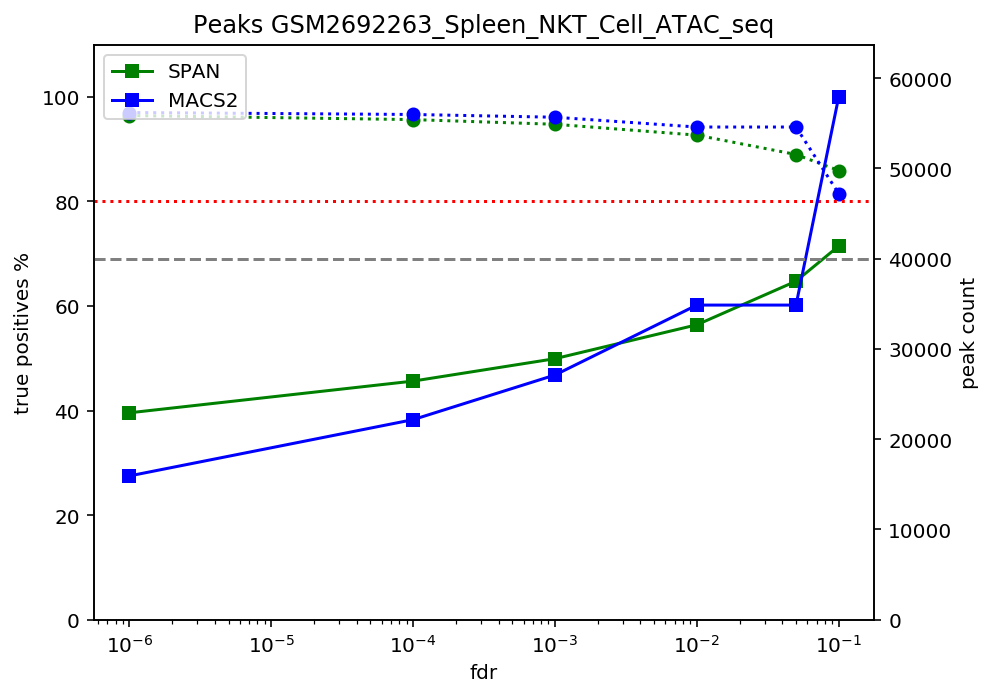

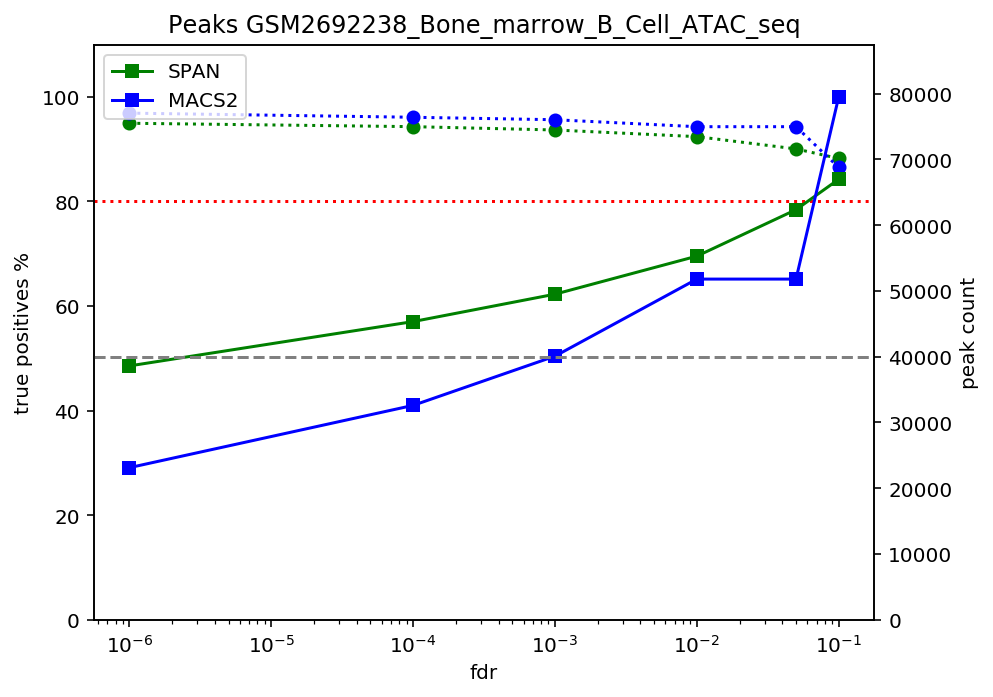

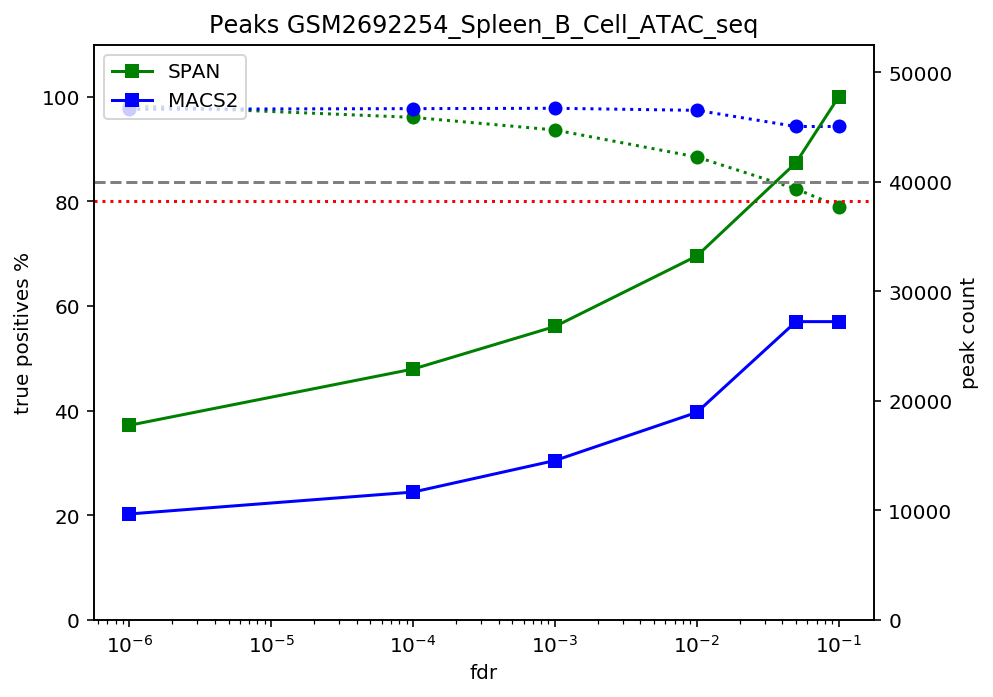

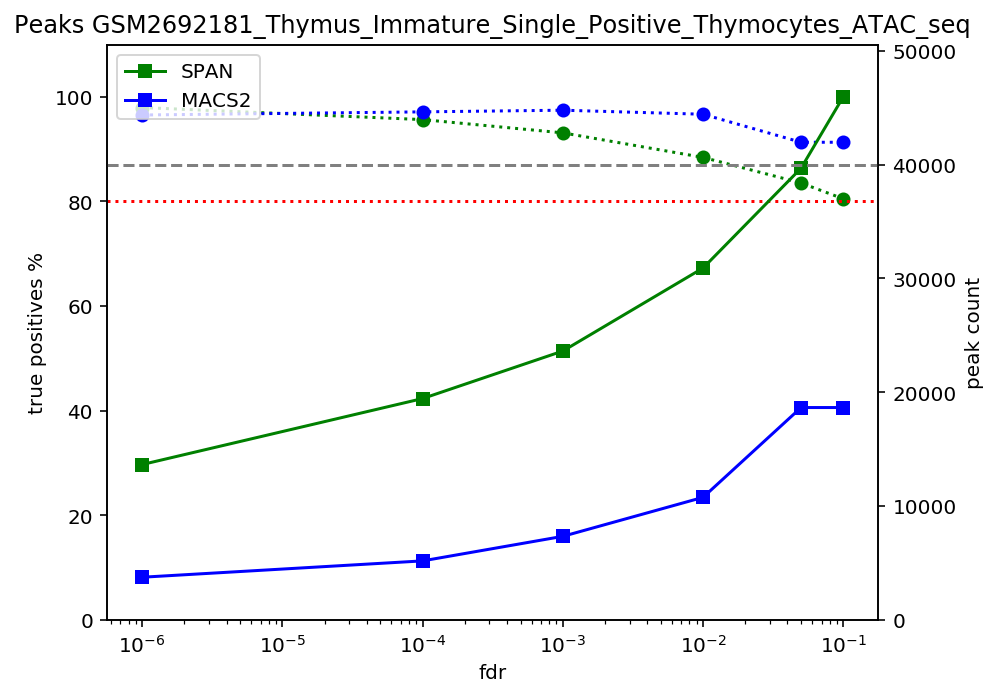

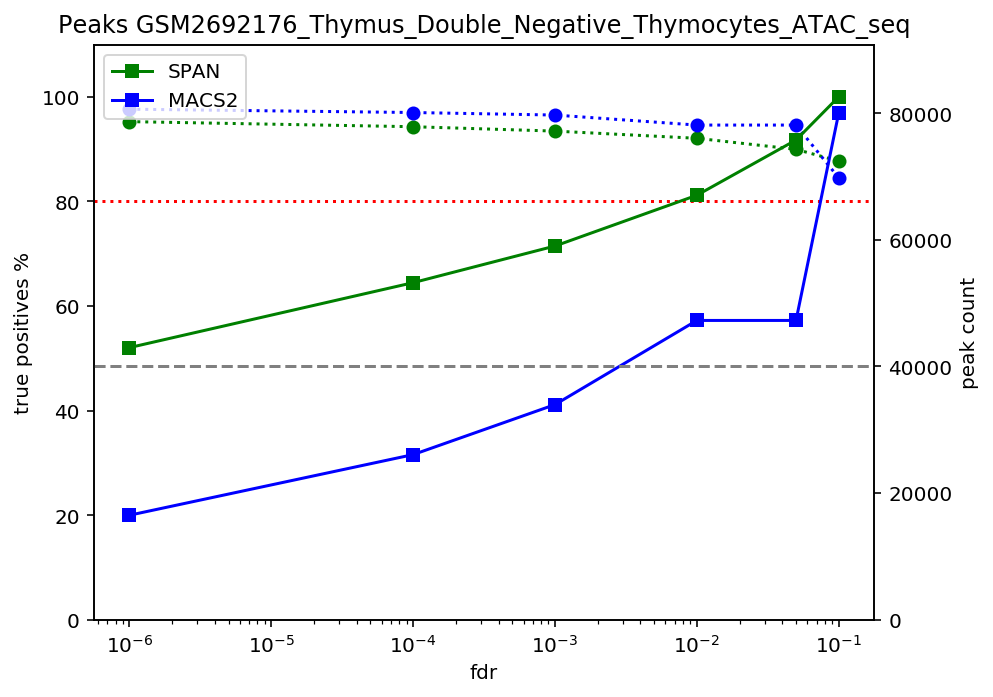

...

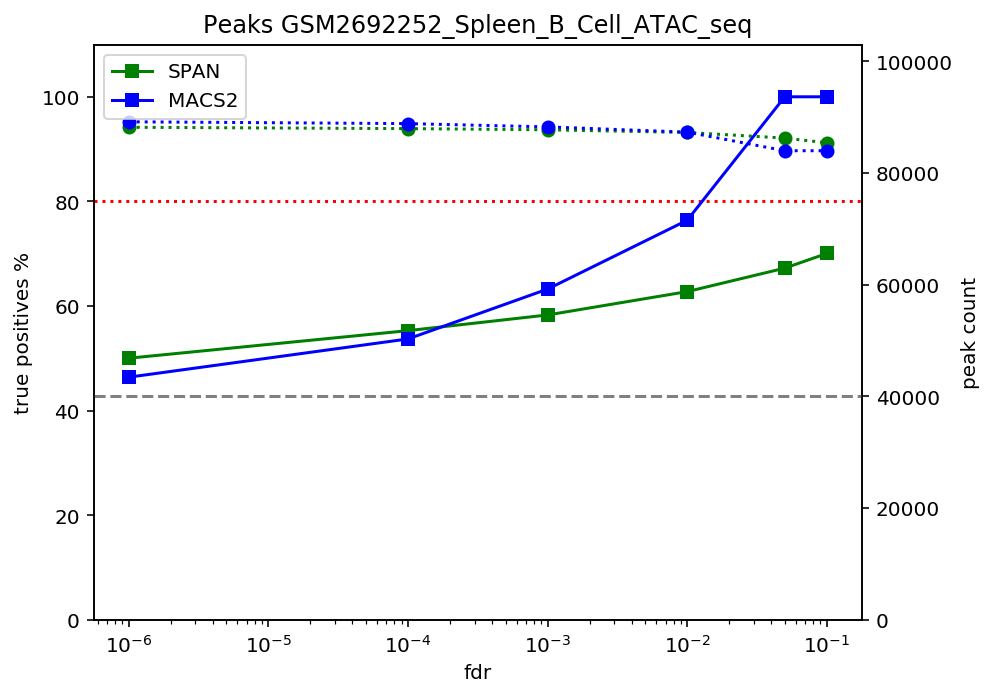

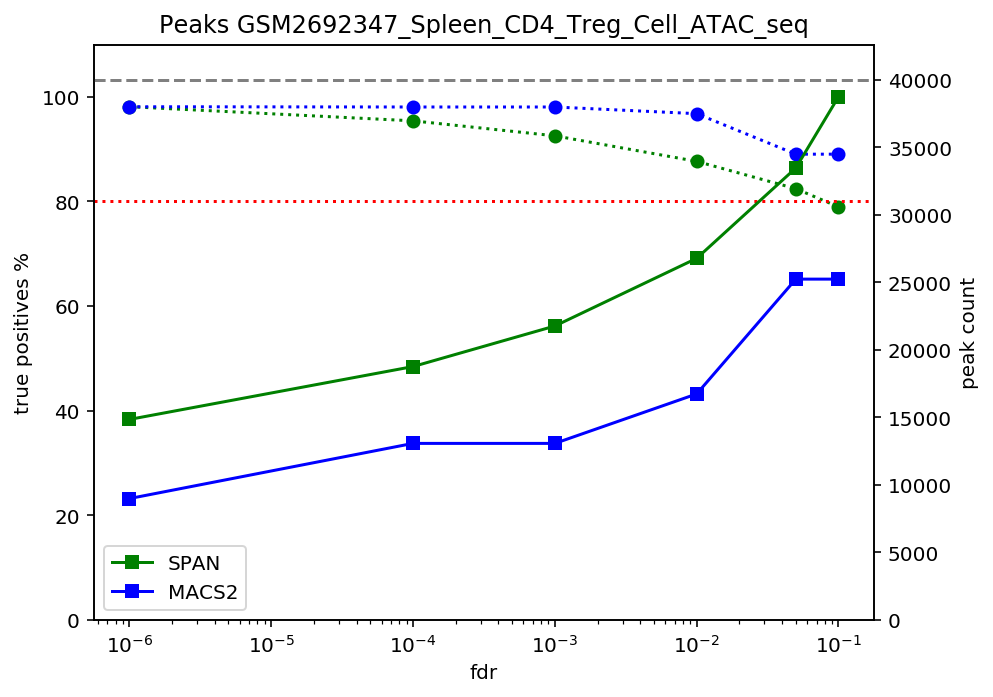

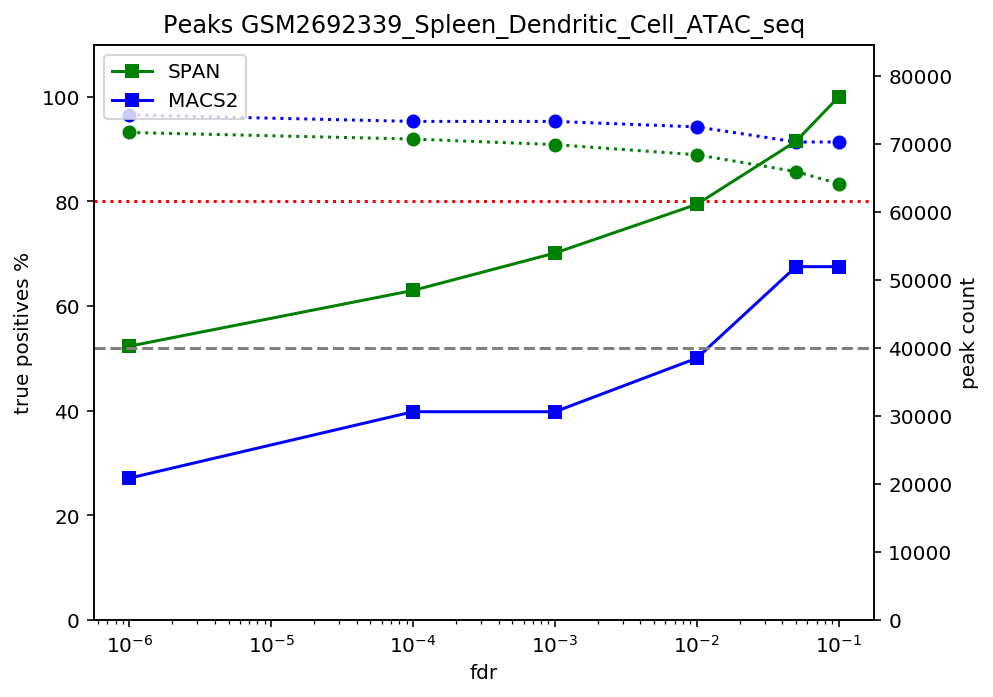

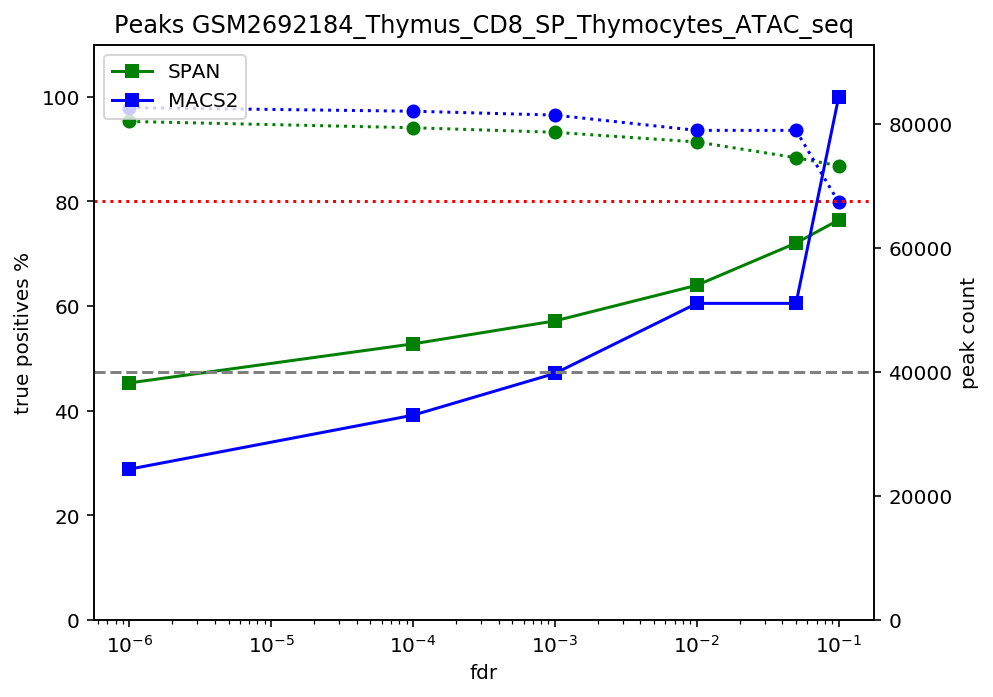

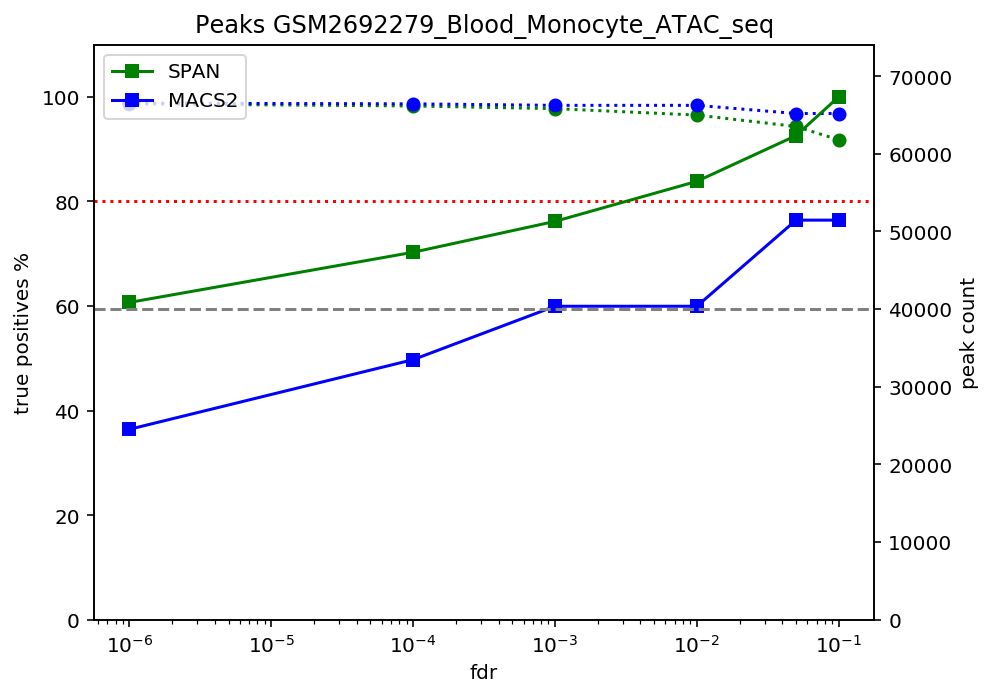

In [81]:
for cell in set(overlap_dataframe['cell']):
    cell_df = overlap_dataframe[np.logical_and(overlap_dataframe['cell'] == cell,
                                               np.logical_and(overlap_dataframe['q'] >= 1e-6,
                                                             overlap_dataframe['q'] <= 0.1))]
    span_peak_count = cell_df[cell_df['peak_caller'] == 'span']
    macs2_peak_count = cell_df[cell_df['peak_caller'] == 'macs2']

    fig, ax1 = plt.subplots(figsize=(7, 5))
    ax1.set_ylim(0, 110)
    ax1.plot(span_peak_count['q'], span_peak_count['peak_by_dhs'], 'o:', c='green', label='SPAN')
    ax1.plot(macs2_peak_count['q'], macs2_peak_count['peak_by_dhs'], 'o:', c='blue', label='MACS2')
    ax1.axhline(y=80, color='r', linestyle=':')
    ax1.set_ylabel('true positives %')
    ax1.set_xlabel('fdr')

    ax2 = ax1.twinx()
    ax2.set_ylim(0, 1.1 * max(cell_df['peak_count']))
    ax2.plot(span_peak_count['q'], span_peak_count['peak_count'], 's-', c='green', label='SPAN')
    ax2.plot(macs2_peak_count['q'], macs2_peak_count['peak_count'], 's-', c='blue', label='MACS2')
    ax2.axhline(y=40000, color='gray', linestyle='--')
    ax2.set_xscale('log')
    ax2.set_ylabel('peak count')

    plt.title('Peaks ' + cell)        
    plt.legend()

    fig.tight_layout()
    plt.show()

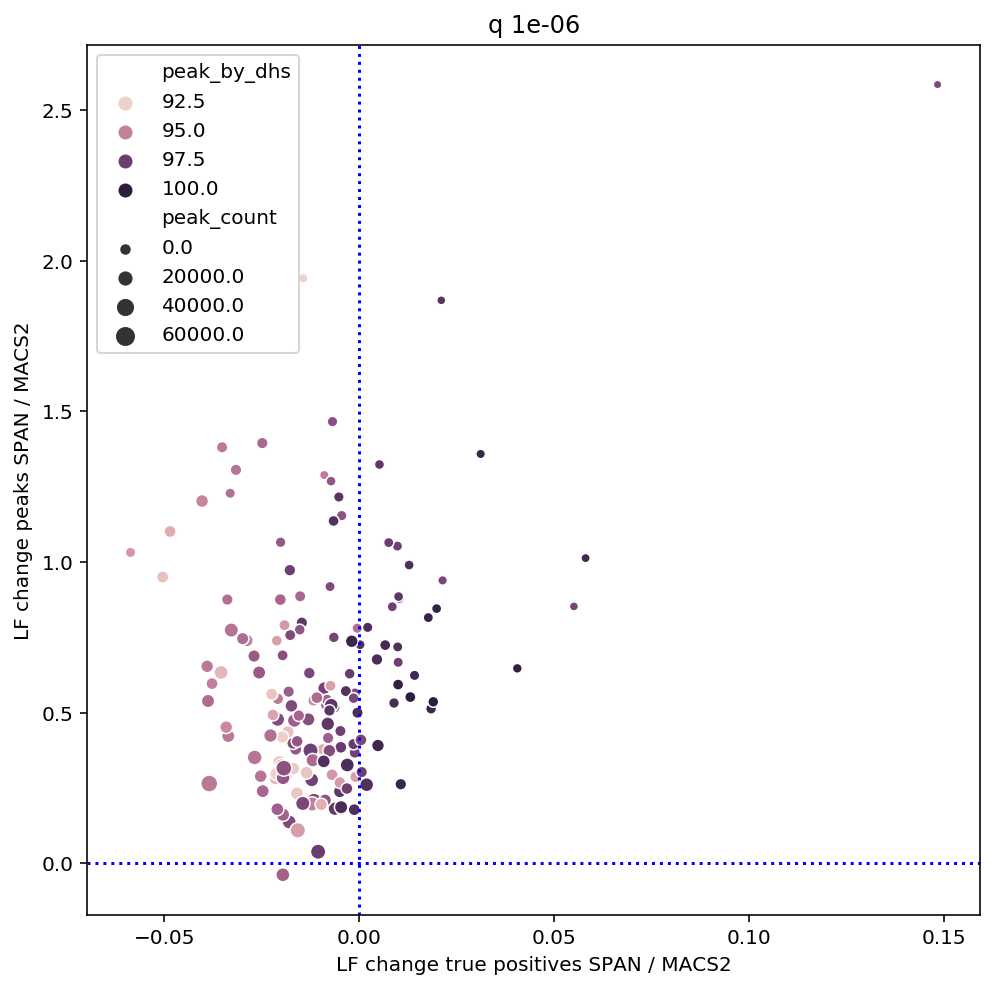

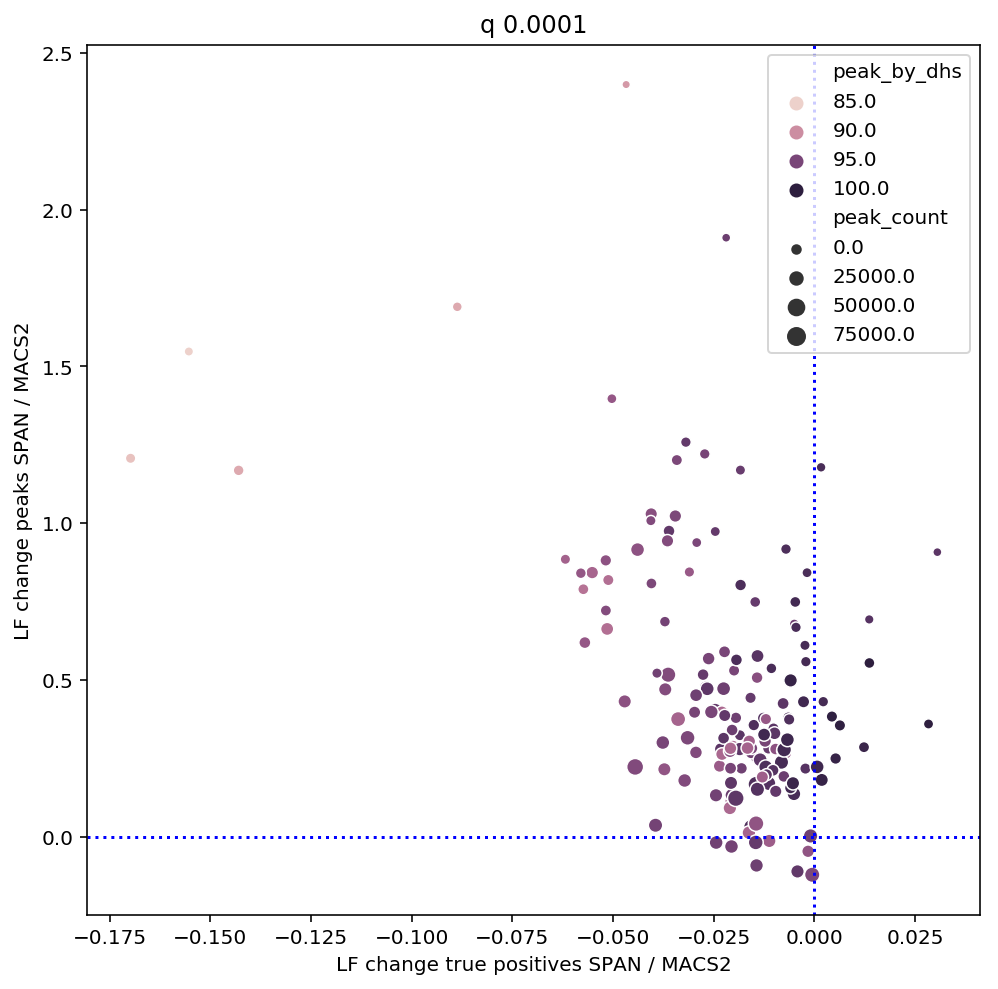

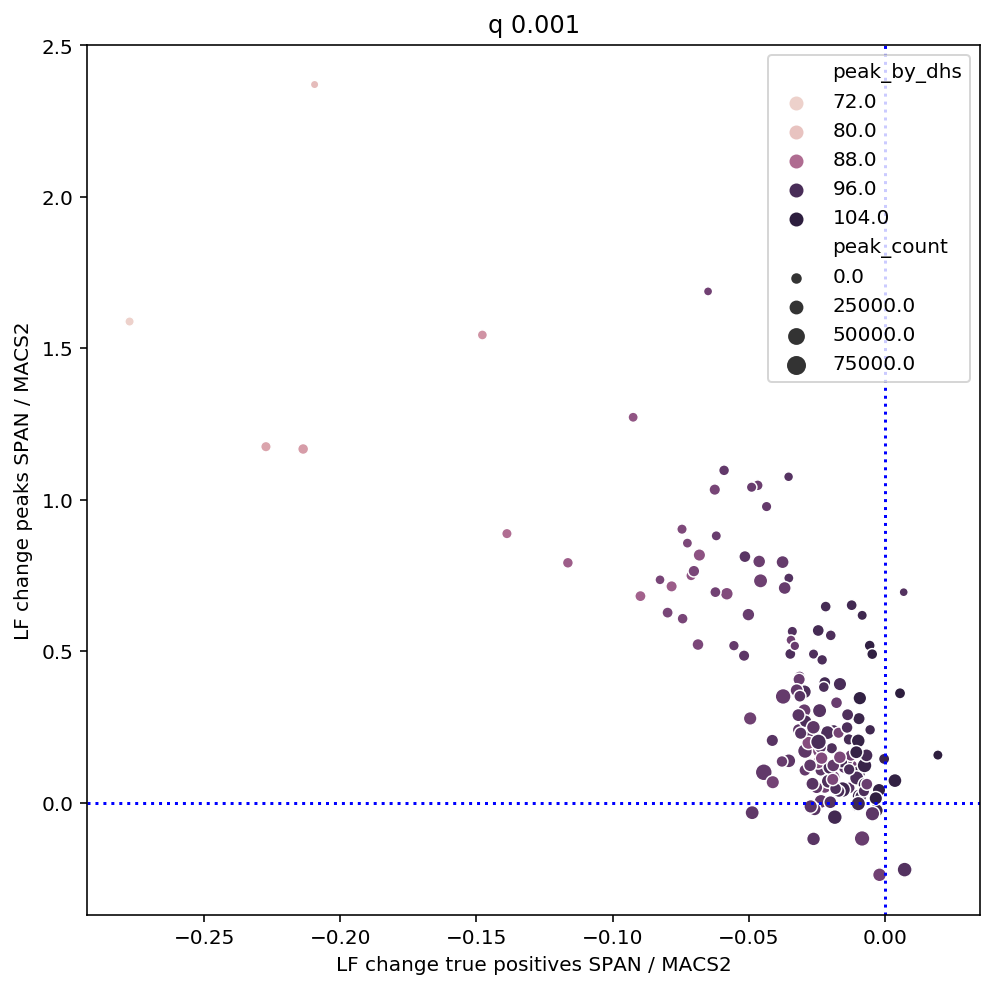

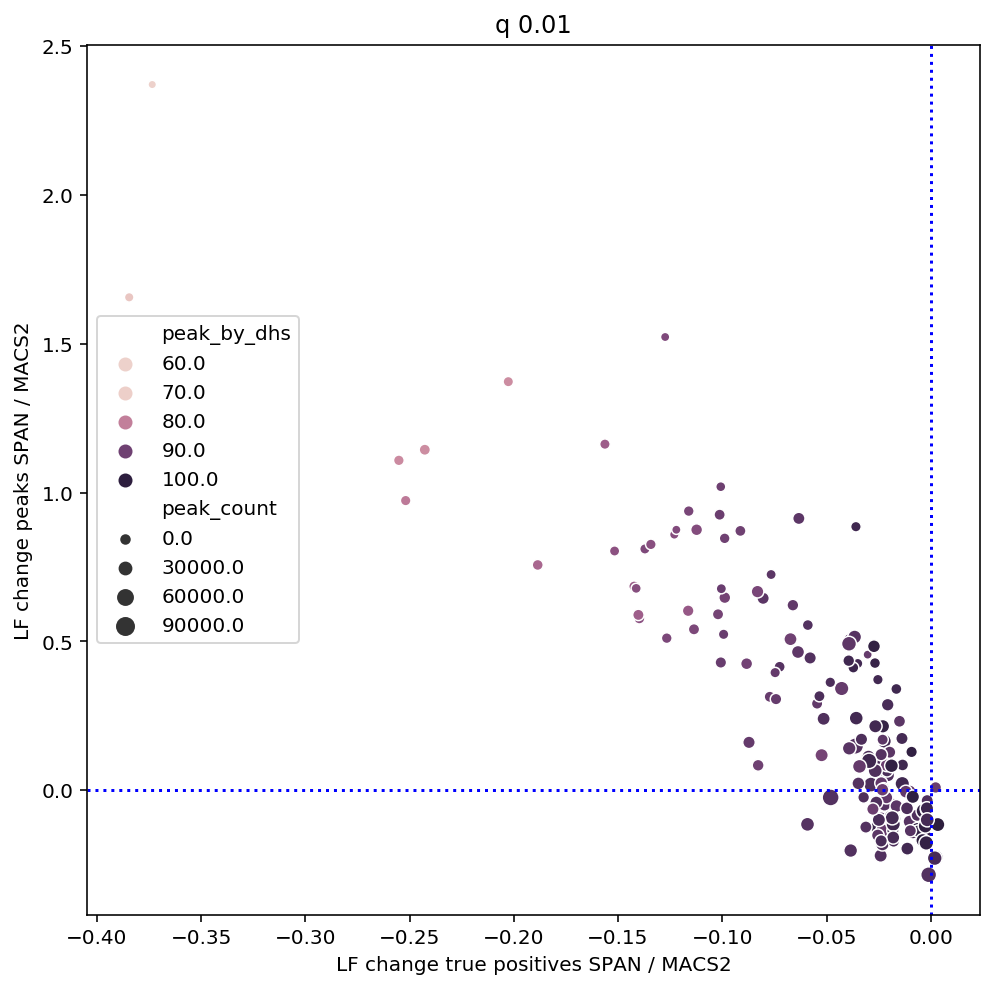

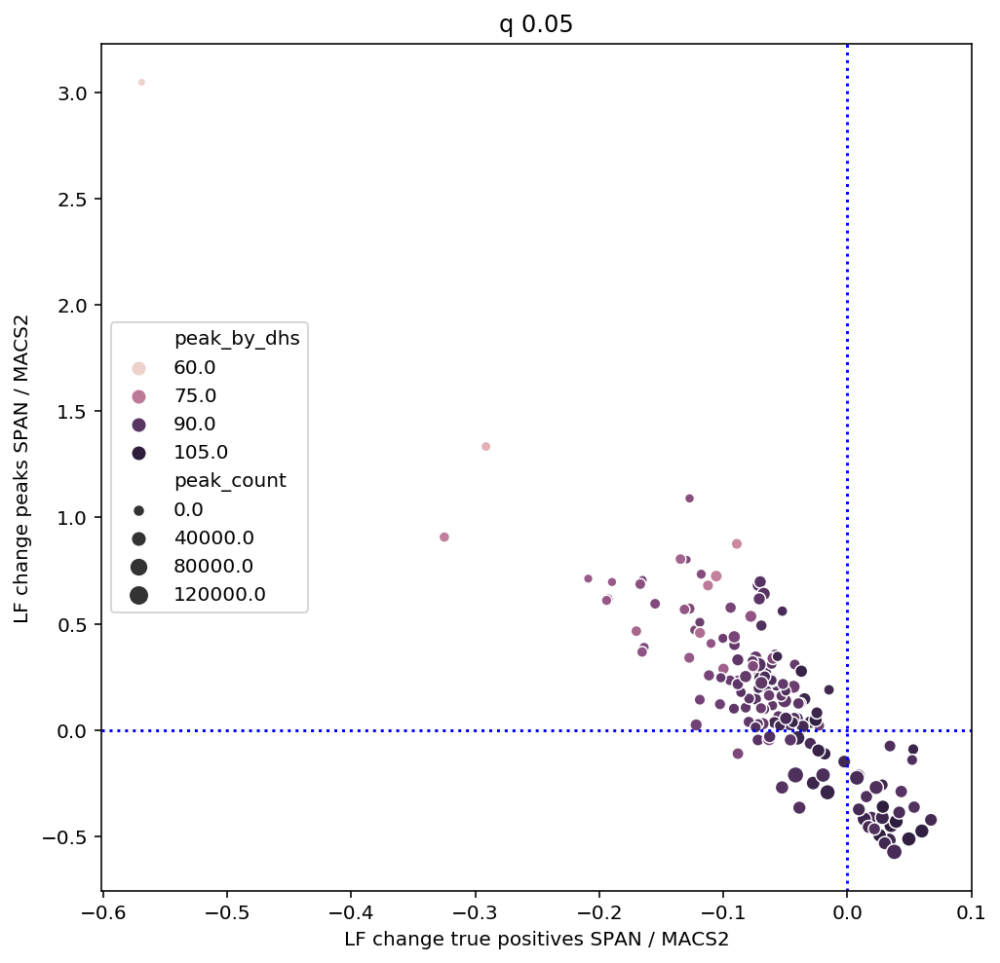

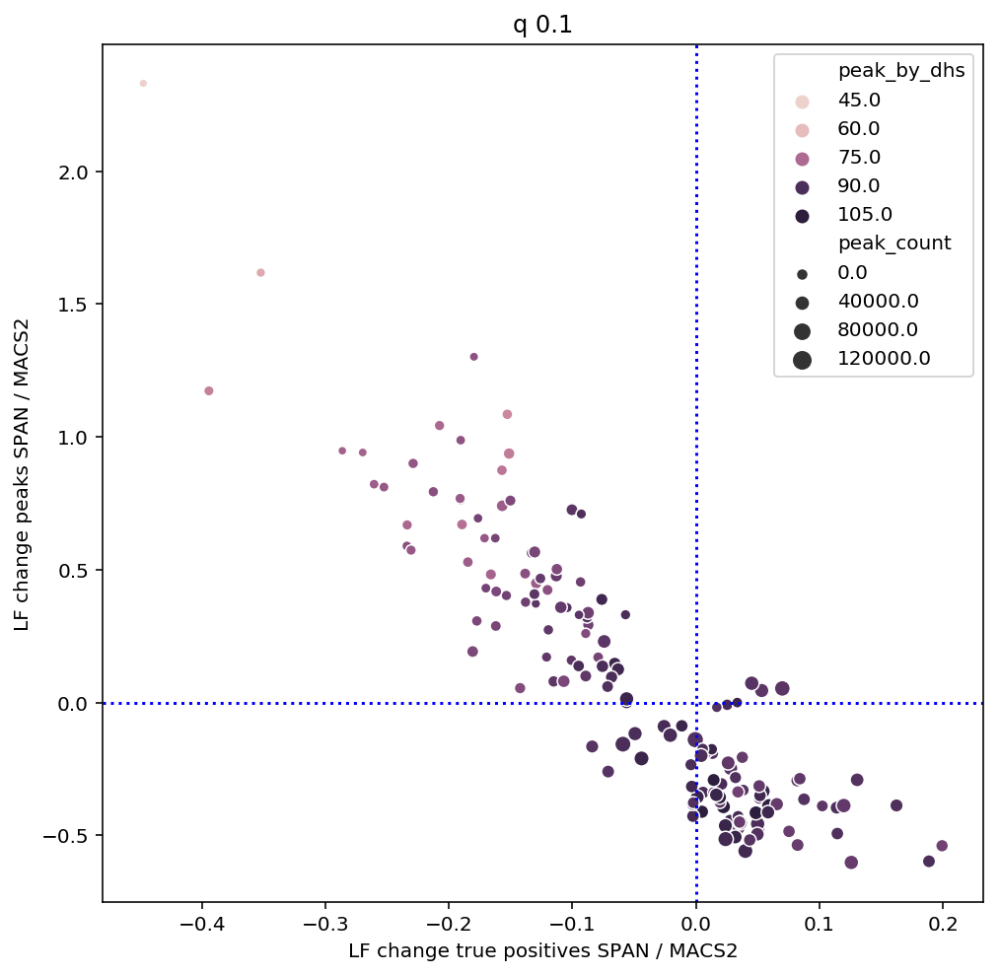

In [91]:
import seaborn as sns

q_df = overlap_dataframe[np.logical_and(overlap_dataframe['q'] >= 1e-6,
                                        overlap_dataframe['q'] <= 0.1)].copy()

for q in sorted(set(q_df['q'])):
    ddf = pd.DataFrame(columns=['lf_peak_by_dhs', 'lf_peak_count', 'q', 'peak_by_dhs', 'peak_count'])
    for cell in set(overlap_dataframe['cell']):
        cq_df = q_df[np.logical_and(q_df['q'] ==q, q_df['cell'] == cell)]
        cqmacs2_df = cq_df[cq_df['peak_caller']=='macs2']
        cqspan_df = cq_df[cq_df['peak_caller']=='span']
        peak_by_dhs_span = list(cqspan_df['peak_by_dhs'])[0]
        peak_by_dhs_macs2 = list(cqmacs2_df['peak_by_dhs'])[0]
        lf_peak_by_dhs = np.log2((peak_by_dhs_span + 1) / (peak_by_dhs_macs2 + 1))
        peak_count_span = list(cqspan_df['peak_count'])[0]
        peak_count_macs2 = list(cqmacs2_df['peak_count'])[0]
        lf_peak_count = np.log2((peak_count_span + 1) / (peak_count_macs2 + 1))
        ddf.loc[len(ddf)] = (lf_peak_by_dhs, lf_peak_count, q, peak_by_dhs_span, peak_count_macs2)
    plt.figure(figsize=(8, 8))        
    sns.scatterplot(data=ddf, x='lf_peak_by_dhs', y='lf_peak_count', hue='peak_by_dhs', size='peak_count')
    plt.axhline(y=0.0, color='b', linestyle=':')
    plt.axvline(x=0.0, color='b', linestyle=':')
    plt.title('q {}'.format(q))
    plt.xlabel('LF change true positives SPAN / MACS2')
    plt.ylabel('LF change peaks SPAN / MACS2')
    plt.show()

# Venn diagrams

In [ ]:
import seaborn as sns
for cell in CELLS:
    mdf = overlap_dataframe[overlap_dataframe['cell'] == cell]\
    [['peak_caller', 'q', 'peak_count', 'dhs_by_peak', 'peak_by_dhs']].copy()
    dhs_file = DHS_FILES[cell] if cell in DHS_FILES else dhs_hg19
    mdf['dhs_ex'] = (np.ones(len(mdf)) - mdf['dhs_by_peak'] / 100) * dhs_file.count()
    mdf['peaks_ex'] = (np.ones(len(mdf)) - mdf['peak_by_dhs'] / 100) * mdf['peak_count']
    mdf['both'] = mdf['peak_by_dhs'] * mdf['peak_count'] / 100

    axs = {}

    mdf['qp'] = mdf['q'].astype(str) + " " + mdf['peak_caller']
    qpl = len(set(mdf['qp']))
    fig = plt.figure(figsize=(qpl, 4))
    offset = 0
    for q in QS:
        data = mdf.loc[mdf['q'] == float(q)]
        xlabels = []
        for t in data['peak_caller']:
            if t not in xlabels:
                xlabels.append(t)
        w = len(set(data['peak_caller']))
        ax = plt.subplot2grid((1, qpl), (0, offset), colspan=w)
        p1 = ax.bar(data['peak_caller'], data['both'])
        p2 = ax.bar(data['peak_caller'], data['peaks_ex'],
                    bottom=data['both'])
        p3 = ax.bar(data['peak_caller'], data['dhs_ex'],
                    bottom=-data['dhs_ex'])

        ax.legend().set_visible(False)
        axs[ax] = plt.ylim()
        if offset > 0:
            ax.get_yaxis().set_ticklabels([])
            ax.set_ylabel('')
        else:
            ax.set_ylabel('peaks')

        offset += w
        ax.set_xlabel('')
        ax.set_title(cell + ' ' + q)
        plt.xticks(range(0, len(xlabels)), xlabels, rotation=90)

    ymin = np.min([v[0] for v in axs.values()])
    ymax = np.max([v[1] for v in axs.values()])

    for ax in axs.keys():
        ax.set_ylim(bottom = ymin, top = ymax)
    plt.tight_layout()
    plt.show()